In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.naive_bayes import GaussianNB
import sklearn as skl
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.inspection import permutation_importance
from io import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus

%matplotlib inline



In [2]:
housing_file_path='housing3.csv'
housing_data= pd.read_csv(housing_file_path)


# Initial data information
The purpose of this kernel is to predict the price category of a house that a realtor can charge, or a customer can invest to buy a house by considering multiple input factors. This dataset contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015. The dataset is pretty unbalanced with wide range of houses information that are built and renovated from the year 1990 to 2015. 


id: This is unique identification number given to each house in the dataset.



date: This is the date the house is added into the dataset and is in the format YYYY-MM-DD.


price Ordinal Price category from 1 - 5


bedrooms Numerical, number of bedrooms \[0,33\]


bathrooms Numerical number of bathrooms \[0,8\]


sqft_living Numerical area of the house, including all floors


sqft_lot Numerical area of lot


floors Numerical Number of floors available in house.


waterfront Boolean 0/1 Does the house have an ocean view


view Numerical Rating of view of from house and is rated from 0 to 5.


condition Numerical Overall condition of house rated in the range 1 to 5.


grade Numerical Overall grade of house ranging from 1 to 12.


sqft_above Numerical surface of the house excluding basement and ground floor.


sqft_basement Numerical The surface of the basement floor


yr_built Numerical The year of house in which it is constructed.


yr_renovated Numerical Year in which house is renovated or remodeled.


zipcode Categorical It is a 5 digit zip code in which the house is located.


lat Numerical Geographical Latitude position of the house.


long Numerical Geographical longitude position of the house.


sqft_living15 Numerical It is the average house square footage of the 15 closest houses.


sqft_lot15 Numerical It is the average lot square footage of the 15 closest houses.


In [3]:
print(housing_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  int64  
 3   bedrooms       21367 non-null  float64
 4   bathrooms      21613 non-null  float64
 5   sqft_living    20919 non-null  float64
 6   sqft_lot       21351 non-null  float64
 7   floors         20038 non-null  float64
 8   waterfront     20962 non-null  float64
 9   view           20470 non-null  float64
 10  condition      21354 non-null  float64
 11  grade          20027 non-null  float64
 12  sqft_above     21332 non-null  float64
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   19221 non-null  float64
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

The data included contains several columns which contain numeric values but are actually categorical. So we set the correct data types on the columns so the describe function will operate correctly on them. Once this is done we remove rows containing missing data and use the describe function to get the correct column statistics.
We drop the id column when calling describe as it cannot provide any information

In [4]:
housing_data.date=pd.to_datetime(housing_data.date)
housing_data.price = pd.Categorical(housing_data.price, ordered=True)
housing_data.waterfront = pd.Categorical(housing_data.waterfront)
housing_data.zipcode = pd.Categorical(housing_data.zipcode)

Fix negative values, we assume negative bathroom number is accidental data input error, so just multiply by minus 1

In [5]:
housing_data.bathrooms[housing_data.bathrooms < 0] = housing_data.bathrooms * -1

<ipython-input-5-76c6d8983960>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  housing_data.bathrooms[housing_data.bathrooms < 0] = housing_data.bathrooms * -1


In [6]:
print("Missing values: ")
for col in housing_data.columns:
    if housing_data[col].isnull().values.any():
        print(f"{col}: {housing_data[col].isnull().sum()}")

print(f"\n\nTotal lines: {housing_data.id.count()}")

Missing values: 
bedrooms: 246
sqft_living: 694
sqft_lot: 262
floors: 1575
waterfront: 651
view: 1143
condition: 259
grade: 1586
sqft_above: 281
yr_renovated: 2392
sqft_living15: 257


Total lines: 21613


We deal with missing values as follows:
<br/>Fill sqft_above values with sqft above basement and living where possible, delete what cannot be completed.
<br/>Merge yr_renovated and yr_built to the max between each and create new column 'yr_blt_or_renovated' and drop the old columns
<br/>Numeric data is calculated as the mean value in the same zipcode


We can see that bathrooms and bedrooms vary between zipcodes, so we cannot just use normal average on all values when filling blanks, we should take the zipcode into account.
This is probably true for all values, for example waterfront.

In [7]:
print(housing_data.groupby('zipcode').bedrooms.agg(lambda x: x.mode()[0]).sort_values(ascending=False))
print(housing_data.groupby('zipcode').bathrooms.agg(lambda x: x.mode()[0]).sort_values(ascending=False))

zipcode
98077    4.0
98074    4.0
98039    4.0
98040    4.0
98053    4.0
        ... 
98055    3.0
98056    3.0
98058    3.0
98065    3.0
98199    3.0
Name: bedrooms, Length: 70, dtype: float64
zipcode
98001    2.5
98055    2.5
98033    2.5
98034    2.5
98038    2.5
        ... 
98108    1.0
98107    1.0
98106    1.0
98032    1.0
98125    1.0
Name: bathrooms, Length: 70, dtype: float64


In [8]:
housing_data.bedrooms = housing_data.groupby('zipcode').bedrooms.transform(lambda x: x.fillna(x.mode()[0]))
housing_data.bathrooms = housing_data.groupby('zipcode').bathrooms.transform(lambda x: x.fillna(x.mode()[0]))
housing_data.floors = housing_data.groupby('zipcode').floors.transform(lambda x: x.fillna(x.mode()[0]))
housing_data.sqft_living15 = housing_data.groupby('zipcode').sqft_living15.transform(lambda x: x.fillna(x.mean()))
housing_data.sqft_living15 = housing_data.groupby('zipcode').sqft_living15.transform(lambda x: x.fillna(x.mean()))
housing_data.waterfront = housing_data.groupby('zipcode').waterfront.transform(lambda x: x.fillna(x.mode()[0]))
housing_data.yr_renovated.dropna(inplace=True)
housing_data.condition = housing_data.groupby('zipcode').condition.transform(lambda x: x.fillna(x.mode()[0]))
housing_data.view = housing_data.groupby('zipcode').view.transform(lambda x: x.fillna(x.mode()[0]))
housing_data.grade = housing_data.groupby('zipcode').grade.transform(lambda x: x.fillna(x.mode()[0]))


We know the sqft_living, sqft_above and sqft_basement follow the equation: sqft_above = sqft_living - sqft_basement.

So if two of the values appear in a line and the 3rd is missing, we can complete it.

The reset are deleted

In [9]:
housing_data.loc[(housing_data['sqft_above'].isna()) & (housing_data['sqft_living'] > 0) & (housing_data['sqft_basement'] >= 0), 'sqft_above'] = housing_data['sqft_living'] - housing_data['sqft_basement']
housing_data.loc[(housing_data['sqft_above'] > 0) & (housing_data['sqft_living'].isna()) & (housing_data['sqft_basement'] >= 0), 'sqft_living'] = housing_data['sqft_above'] + housing_data['sqft_basement']

housing_data.drop(housing_data[(housing_data.sqft_living.isna()) | (housing_data.sqft_above.isna()) | (housing_data.sqft_basement.isna())].index, inplace=True)


## Feature analysis

 Our taget feature is price, we can see that it is normally distributed

In [10]:
prices = pd.DataFrame()
prices['price_count'] = housing_data.price.value_counts().sort_index()
prices['percent'] = ((prices.price_count / housing_data.shape[0]) * 100).round(2)
prices

,price_count,percent
1,2301,10.65
2,5274,24.42
3,7772,35.98
4,4219,19.53
5,2033,9.41


<AxesSubplot:xlabel='price', ylabel='count'>

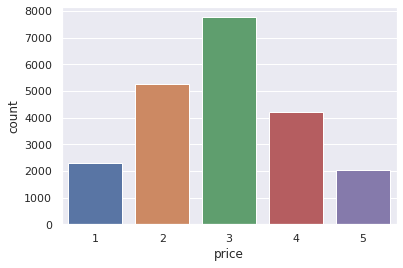

In [11]:
sns.set_theme()
sns.countplot(data=housing_data, x='price')

We can see that in ragards to bedrooms, it seems most of the houses sold contain 3 or 4 bedrooms.
In bathrooms it is not so simple, most of the values range between 1 and 2.5 bedrooms.
F.Y.I - After lots of research I found out that a 0.75 bathroom is a bathroom with a shower and toilet and without a bath. :)

In [12]:
housing_data.bedrooms.value_counts().sort_index().to_frame()

,bedrooms
0.0,13
1.0,196
2.0,2730
3.0,9916
4.0,6830
5.0,1583
6.0,271
7.0,36
8.0,13
9.0,6


In [13]:
housing_data.bathrooms.value_counts().sort_index().to_frame()

,bathrooms
0.00,10
0.50,4
0.75,72
1.00,3850
1.25,9
1.50,1441
1.75,3040
2.00,1931
2.25,2046
2.50,5374


<AxesSubplot:title={'center':'Bathrooms'}, xlabel='Bathrooms', ylabel='Sales'>

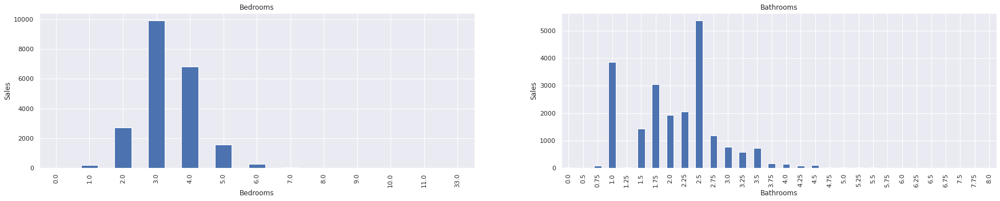

In [14]:
 
 fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(30,5))
 housing_data.bedrooms.value_counts().sort_index().plot(kind='bar', ax=axes[0], title='Bedrooms', xlabel="Bedrooms", ylabel="Sales")
 housing_data.bathrooms.value_counts().sort_index().plot(kind='bar', ax=axes[1], title='Bathrooms', xlabel="Bathrooms", ylabel="Sales")
 

Both grade and condition rate the house by 'quality'
We can see that the condition of most houses is 3, when looking at the grade we can see that the is also centered along the middle value of 7
We noticed some values 'grade' = 13, this is probably a mistake since the range is up to 12, we fix this by setting it to 12

In [15]:
condition = pd.DataFrame()
condition['condition_count'] = housing_data.condition.value_counts().sort_index()
condition['precent'] = (condition.condition_count / housing_data.shape[0] * 100).round(2)
condition

,condition_count,precent
1.0,30,0.14
2.0,169,0.78
3.0,14113,65.34
4.0,5610,25.97
5.0,1677,7.76


In [16]:
housing_data.grade[housing_data.grade > 12] = 12
grade = pd.DataFrame()
grade['grade_count'] = housing_data.grade.value_counts().sort_index()
grade['precent'] = (grade.grade_count / housing_data.shape[0] * 100).round(2)
grade

<ipython-input-16-ec92703cdff3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  housing_data.grade[housing_data.grade > 12] = 12


,grade_count,precent
1.0,1,0.00
3.0,3,0.01
4.0,29,0.13
5.0,221,1.02
6.0,1903,8.81
7.0,9461,43.80
8.0,5941,27.51
9.0,2487,11.51
10.0,1085,5.02
11.0,372,1.72


<AxesSubplot:title={'center':'Grade'}>

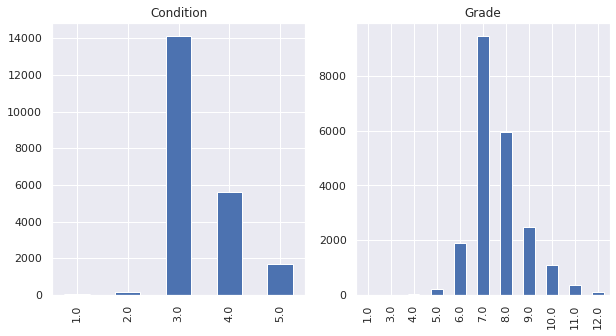

In [17]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
condition.condition_count.plot(kind='bar', ax=axes[0], title='Condition')
grade.grade_count.plot(kind='bar', ax=axes[1], title='Grade')


When looking at house sizes, we can see that living area (whole house) and above ground area are spread out very similarly.
When looking at basement and lot area we found that most of the values range \[0-25\] for basements and \[0-20000\] for lot areas.

<AxesSubplot:title={'center':'Square foot lot area'}, ylabel='Frequency'>

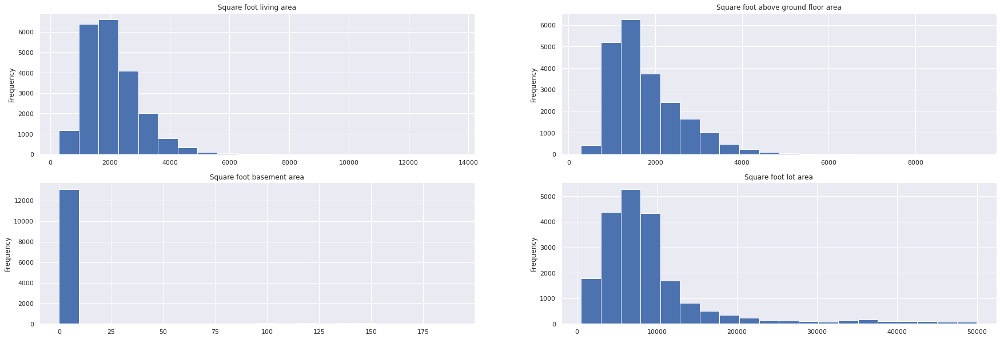

In [18]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(30,10))
housing_data.sqft_living.plot(kind='hist', ax=axes[0,0], bins=20, density=False, title="Square foot living area")
housing_data.sqft_above.plot(kind='hist', ax=axes[0,1], bins=20,  title="Square foot above ground floor area")
housing_data[housing_data.sqft_basement < 200].sqft_basement.plot(kind='hist', ax=axes[1,0], bins=20, title="Square foot basement area")
housing_data[housing_data.sqft_lot < 50000].sqft_lot.plot(kind='hist', ax=axes[1,1], bins=20, title="Square foot lot area")



Here we can see the outliers we removed from the histogram

<AxesSubplot:>

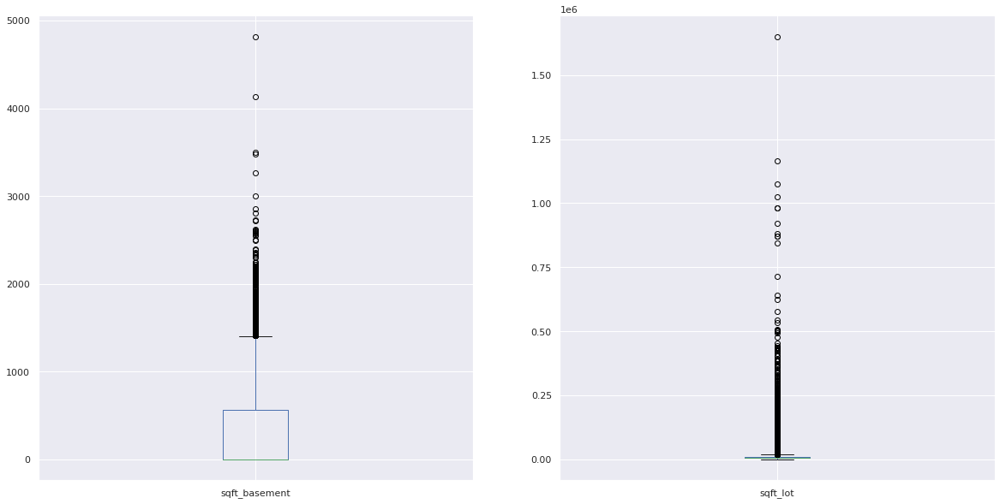

In [19]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,10))
housing_data.sqft_basement.plot(kind='box', ax=axes[0])
housing_data.sqft_lot.plot(kind='box', ax=axes[1])

Most houses sold in king conuty have one or two floors

In [20]:
floors = pd.DataFrame()
floors['floors_count'] = housing_data.floors.value_counts().sort_index()
floors['precent'] = (floors.floors_count / housing_data.shape[0] * 100).round(2)
floors

,floors_count,precent
1.0,10945,50.67
1.5,1773,8.21
2.0,8148,37.72
2.5,149,0.69
3.0,576,2.67
3.5,8,0.04


<AxesSubplot:>

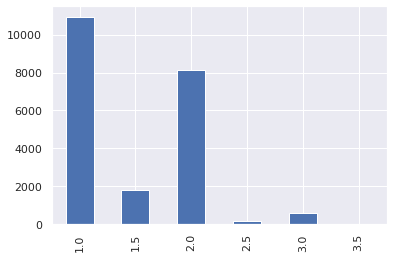

In [21]:
floors.floors_count.plot(kind='bar')

We can see that most houes don't have a waterfront, that will make it hard to classify according to this feature.

In [22]:
housing_data.waterfront.value_counts().to_frame()

,waterfront
0.0,21440
1.0,159


We can see that most of the houses sold have a view rating of zero, it looked wierd, but upon inspection of the houses in question and zipcodes I confirm, they don't have a view.
It mostly means for us that we cannot use this for clasification.

In [23]:
view = housing_data.view.value_counts().to_frame()
view['percent'] = (view.view / housing_data.shape[0]) * 100
view

,view,percent
0.0,19590,90.698643
2.0,922,4.268716
3.0,474,2.194546
1.0,316,1.463031
4.0,297,1.375064


In addition to long/lat coordinates we also have zipcodes which tells us a location but in a less fine granularity

<AxesSubplot:>

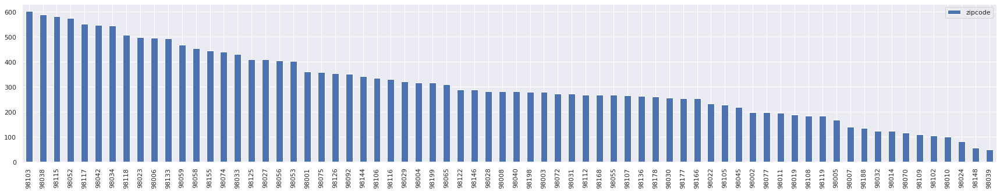

In [24]:
zipcodes = housing_data.zipcode.value_counts().to_frame()
zipcodes.plot(kind='bar', figsize=(30,5))

We can see that house sales have not changed much during the 2014-2015

<AxesSubplot:xlabel='date', ylabel='Sales Count'>

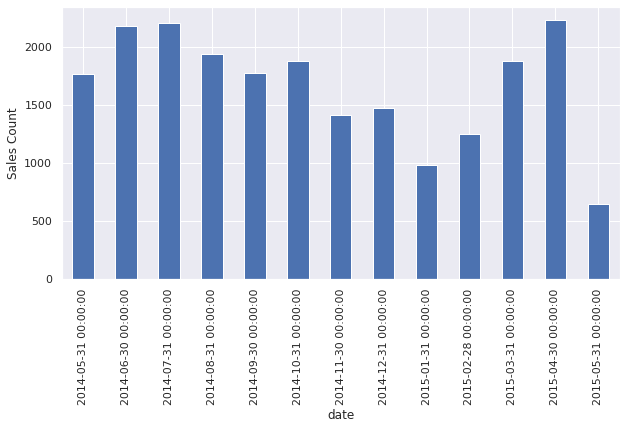

In [25]:
dateIndexed = housing_data.set_index('date')
resampled = dateIndexed.resample('1M').count()
resampled.price.plot(kind='bar', ylabel='Sales Count', figsize=(10,5))

This is our dataset description after we fixed the data, filled in missing values and correctly set column types

In [26]:
housing_data.drop(['id'], axis=1, inplace=True)
housing_data.describe(include='all')

<ipython-input-26-de9875255c4a>:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  housing_data.describe(include='all')


,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,21599,21599.0,21599.000000,21599.000000,21599.000000,2.133700e+04,21599.000000,21599.0,21599.000000,21599.000000,21599.000000,21599.000000,21599.000000,21599.000000,19208.000000,21599.0,21599.000000,21599.000000,21599.000000,21599.000000
unique,372,5.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.0,NaN,NaN,NaN,NaN
top,2014-06-23 00:00:00,3.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98103.0,NaN,NaN,NaN,NaN
freq,142,7772.0,NaN,NaN,NaN,NaN,NaN,21440.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,602.0,NaN,NaN,NaN,NaN
first,2014-05-02 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2015-05-27 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,3.368165,2.115399,2079.729617,1.510063e+04,1.482893,NaN,0.220844,3.404417,7.633733,1788.184407,291.545210,1971.000972,83.847043,NaN,47.558779,-118.218313,1986.047999,12764.628038
std,NaN,NaN,0.926315,0.770553,918.525402,4.147330e+04,0.537678,NaN,0.744414,0.648190,1.147987,828.039127,442.608993,29.375033,400.402525,NaN,0.242512,1.011900,682.420074,27306.246605
min,NaN,NaN,0.000000,0.000000,290.000000,5.200000e+02,1.000000,NaN,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,NaN,46.568027,-122.535488,399.000000,651.000000
25%,NaN,NaN,3.000000,1.750000,1420.000000,5.040000e+03,1.000000,NaN,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,NaN,47.394098,-118.902166,1490.000000,5100.000000


# Exploratory Data Analysis
First we wish to see how the values affect prices

<AxesSubplot:>

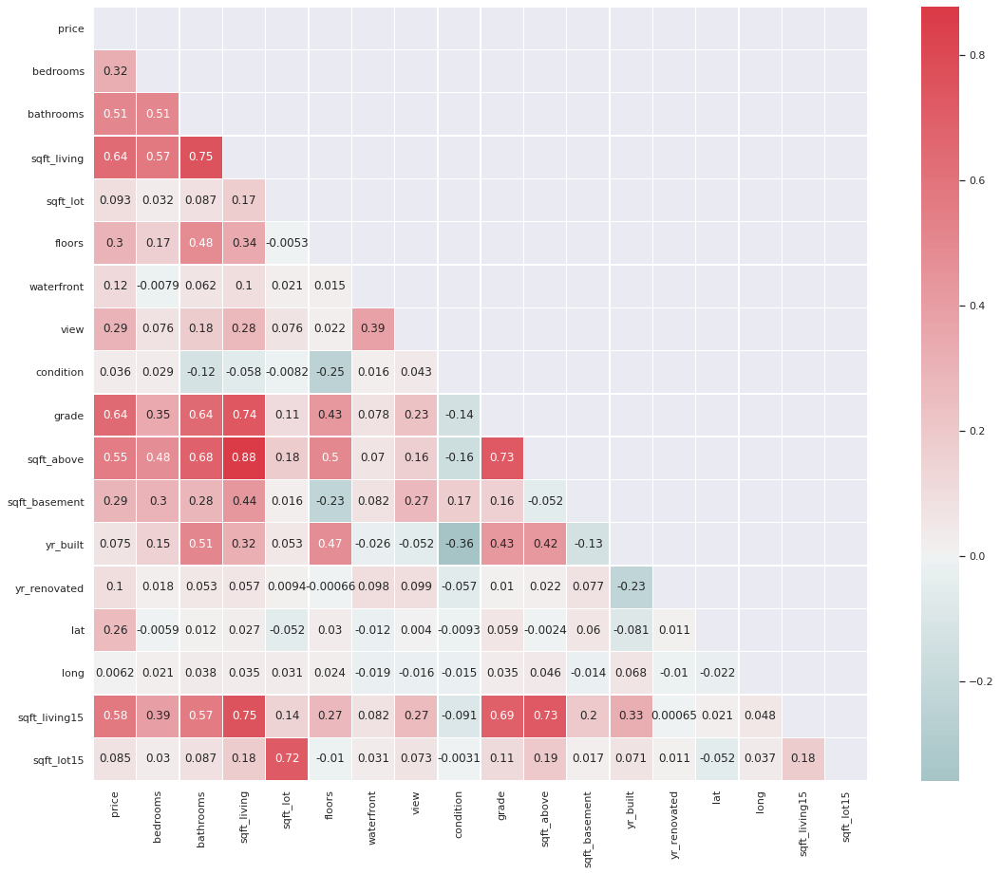

In [27]:

housing_data.price = housing_data.price.astype('int64')
housing_data.waterfront = housing_data.waterfront.astype('int64')
corr = housing_data.corr()

mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(20, 15))
cmap = sns.diverging_palette(200, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, annot=True,
            square=True, linewidths=.5)



According to the heatmap, the following features affect the price most:

    bedrooms, bathrooms, sqft_living, floors, view, grade, sqft_above, sqft_basement, lat, sqft_living15

### Grade & sqft_living and above

I can see from the corrolation matrix that the values of grade and sqft_living have the higest corrolation in regarding to price.

I shall chart them together, using hls pallete (fitting categoriacl data), and it easy to see that higher grades have bigger size.

The same result I see when charting sqft_above with grade

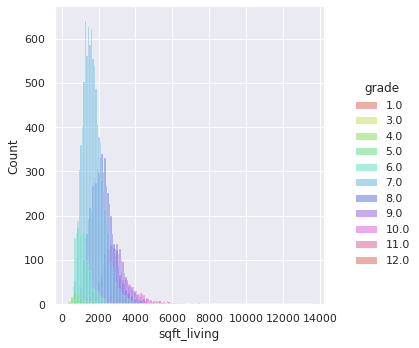

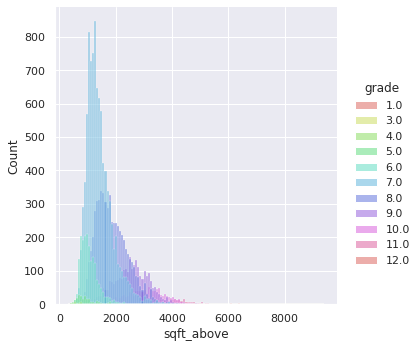

In [28]:

sns.displot(data=housing_data, x='sqft_living', hue="grade", palette='hls')
sns.displot(data=housing_data, x='sqft_above', hue="grade", palette='hls')


### Relations to sqft_living
I showed that sqft_living & sqft_above are connected, and we see in the corrolation matrix there is a 0.88 relation between the two. since the ground level is limited so when sqft_above is large and it can be very large depending on floor count, than the entire living area is larger. As expected we can see a linear relation between the two (representing house with a single floor) where most of the time the sqft_living is larger as it depicts the entire house (including above and basement)

/home/moriel99/.local/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/moriel99/.local/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


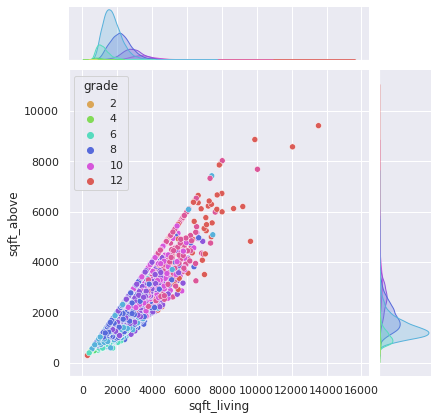

In [29]:
sns.jointplot(x="sqft_living", y="sqft_above", palette="hls", hue="grade", data=housing_data)

When filling values we claimed that houses in the same zipcode have similar features. here we can prove it, when looking at the size of the 15 houses closest to our house.
We added a feature called living_ratio which is the ration between sqft_living15 and sqft_living and we see that for the most part the colors are between group 1 and group 2, meaning the sizes are very close to one another.

Since the sizes are the pretty much the same, it makes sense that the grade feature has similar corrolarity with sqft_living15

<AxesSubplot:xlabel='sqft_living', ylabel='sqft_living15'>

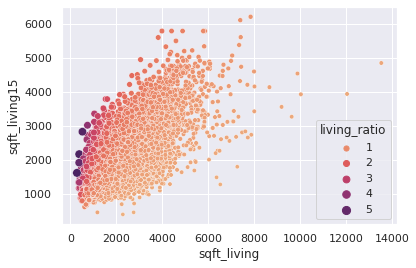

In [30]:
housing_data['living_ratio'] = housing_data.sqft_living15 / housing_data.sqft_living
housing_data['lot_ratio'] = housing_data.sqft_lot15 / housing_data.sqft_lot

sns.scatterplot(data=housing_data, x="sqft_living", y="sqft_living15", size="living_ratio", hue="living_ratio", palette="flare")

<AxesSubplot:xlabel='sqft_lot', ylabel='sqft_lot15'>

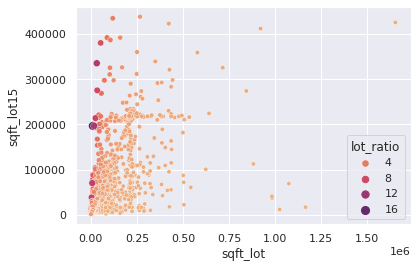

In [31]:
sns.scatterplot(data=housing_data[housing_data.sqft_lot15 < 500000], x="sqft_lot", y="sqft_lot15", size="lot_ratio", hue="lot_ratio", palette="flare")

### Location features

We have longitute and latitude values but they seem to be 'fixed' for privacy. we also checked some of them and they don't lead to houses in king county.

<AxesSubplot:xlabel='long', ylabel='lat'>

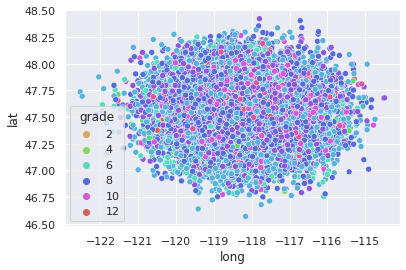

In [32]:
sns.scatterplot(data=housing_data, x="long", y="lat", hue="grade", palette="hls")

Since we don't have zipcodes in the heatmap as it is categorical, we will try and see if there is corrolation between it and price 'manually'
We can see the house price range from zipcode to zipcode, where in most of the sales where made price level 3 at most zipcodes. And high priced houses are only in a couple of zipcodes

<ipython-input-33-ecc7c50d739b>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  price_5['zipcode_count'] = price_5.groupby('zipcode').transform(lambda x: x.count())['price']
<ipython-input-33-ecc7c50d739b>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  price_4['zipcode_count'] = price_4.groupby('zipcode').transform(lambda x: x.count())['price']
<ipython-input-33-ecc7c50d739b>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

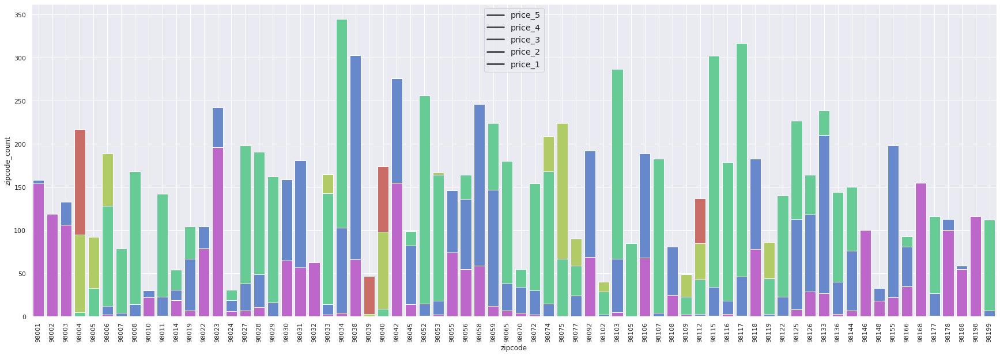

In [33]:
colors = sns.color_palette("hls", 5)

price_5 = housing_data[housing_data.price == 5]
price_4 = housing_data[housing_data.price == 4]
price_3 = housing_data[housing_data.price == 3]
price_2 = housing_data[housing_data.price == 2]
price_1 = housing_data[housing_data.price == 1]


price_5['zipcode_count'] = price_5.groupby('zipcode').transform(lambda x: x.count())['price']
price_4['zipcode_count'] = price_4.groupby('zipcode').transform(lambda x: x.count())['price']
price_3['zipcode_count'] = price_3.groupby('zipcode').transform(lambda x: x.count())['price']
price_2['zipcode_count'] = price_2.groupby('zipcode').transform(lambda x: x.count())['price']
price_1['zipcode_count'] = price_1.groupby('zipcode').transform(lambda x: x.count())['price']

fig_dims = (30, 10)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data=price_5, x="zipcode", y='zipcode_count', color=colors[0], ax=ax)
sns.barplot(data=price_4, x="zipcode", y='zipcode_count', color=colors[1], ax=ax)
sns.barplot(data=price_3, x="zipcode", y='zipcode_count', color=colors[2], ax=ax)
sns.barplot(data=price_2, x="zipcode", y='zipcode_count', color=colors[3], ax=ax)
sns.barplot(data=price_1, x="zipcode", y='zipcode_count', color=colors[4], ax=ax)
plt.xticks(rotation="vertical")
plt.grid(True)
plt.legend(labels=["price_5", "price_4", "price_3", "price_2", "price_1"], fontsize="large")

The following shoes how prices range in the years 2014 and 2015

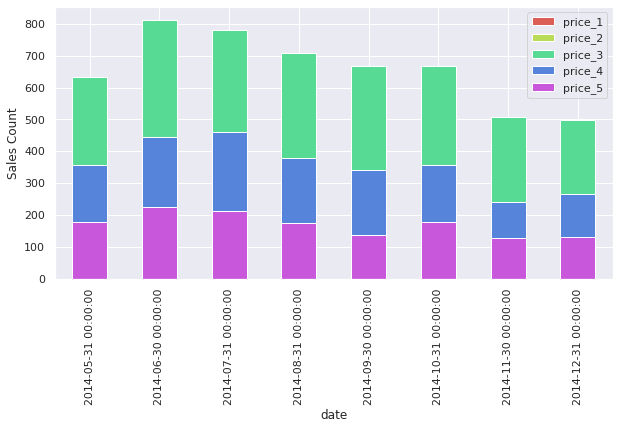

In [34]:
colors = sns.color_palette("hls", 5)
i = 0
for name, group in housing_data[housing_data.date < "2015"].groupby('price'):
    dateIndexed = group.set_index('date')
    resampled = dateIndexed.resample('1M').count()
    resampled.price.plot(kind='bar', y=f"price_{i}", ylabel='Sales Count', color=colors[i], figsize=(10,5))    
    i=i+1

plt.legend(labels=["price_1", "price_2", "price_3", "price_4", "price_5"])

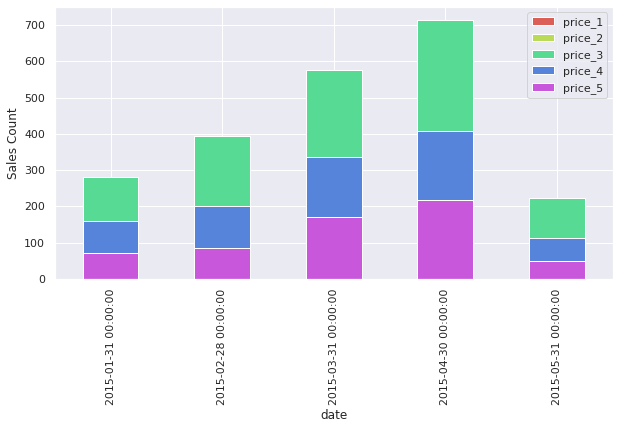

In [43]:
colors = sns.color_palette("hls", 5)
i = 0
for name, group in housing_data[housing_data.date >= "2015"].groupby('price', as_index=False):
    dateIndexed = group.set_index('date')
    resampled = dateIndexed.resample('1M').count()
    resampled.price.plot(kind='bar', y="price", ylabel='Sales Count', color=colors[i], figsize=(10,5))    
    i=i+1
plt.legend(labels=["price_1", "price_2", "price_3", "price_4", "price_5"])

We can see how prices range across the coordinates we receive.

<AxesSubplot:xlabel='long', ylabel='lat'>

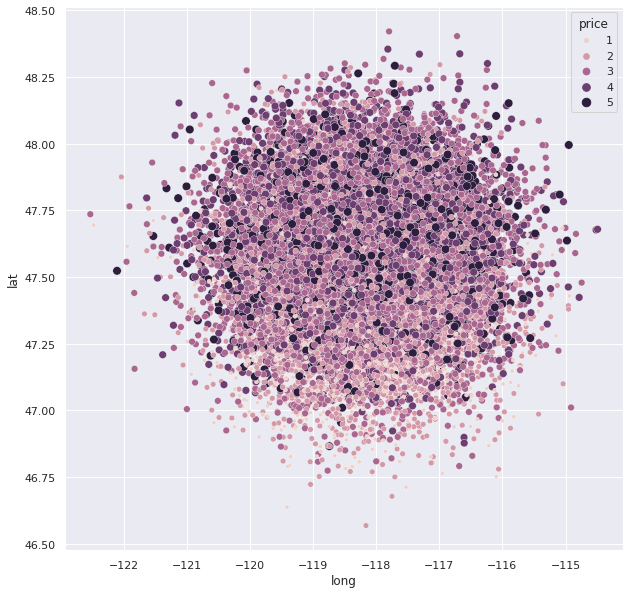

In [36]:
fig_dims = (10, 10)
fig, ax = plt.subplots(figsize=fig_dims)

sns.scatterplot(data=housing_data, x="long", y="lat", size="price", hue="price", ax=ax)

Now we see how sqft_livin relate to price, we can see the center of the violin is increasing as we go up with prices
<br/>
for example in blue violin, the 'center' is at around 1000, where most of the values around this size

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

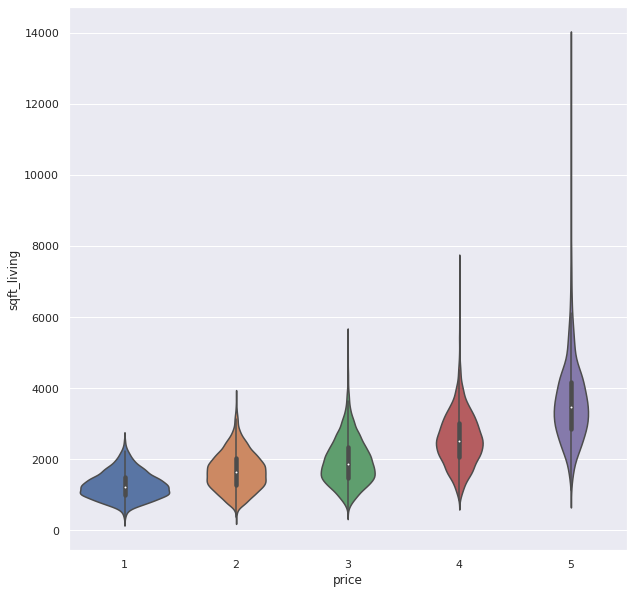

In [37]:
fig, ax = plt.subplots(figsize=fig_dims)
sns.violinplot(data=housing_data, x="price", y="sqft_living")


In the joint plot below we see that as we go to the higher price point the minimal and maximal grades rise.

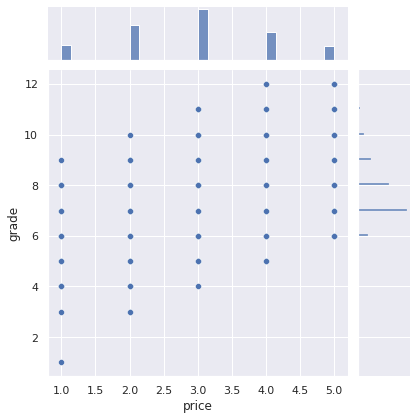

In [38]:
sns.jointplot(data=housing_data, x="price", y="grade")

# Classification


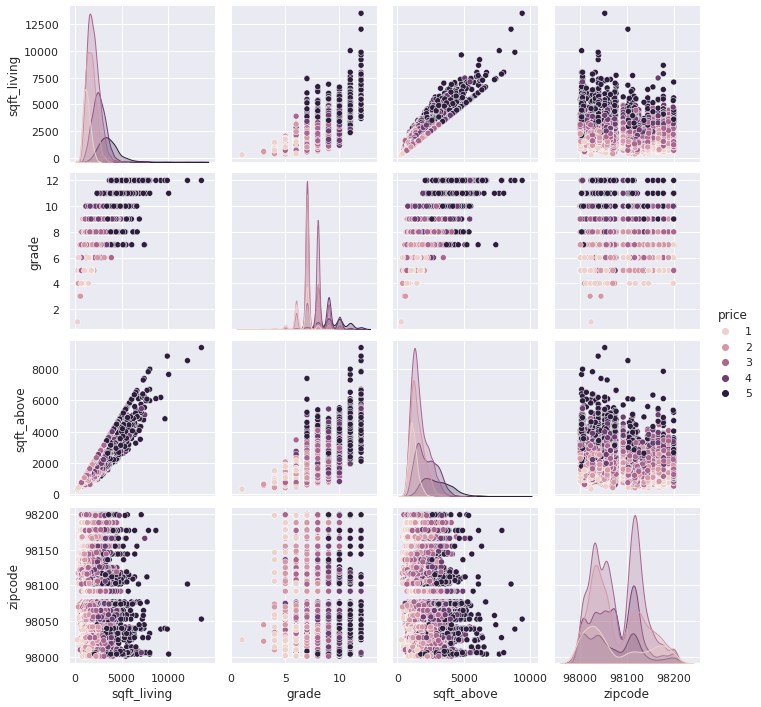

In [39]:
housing_data.zipcode = housing_data.zipcode.astype('int64')
sns.pairplot(data=housing_data, hue='price', vars=['sqft_living', 'grade', 'sqft_above', 'zipcode'])


## Naive Bayes CLS

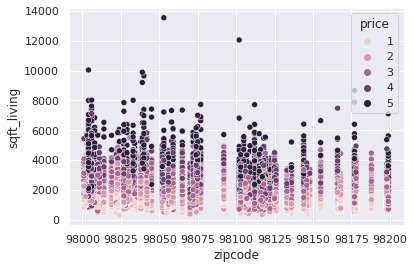

              precision    recall  f1-score   support

           1       0.49      0.27      0.35       657
           2       0.41      0.21      0.28      1599
           3       0.45      0.77      0.57      2353
           4       0.41      0.32      0.36      1245
           5       0.75      0.42      0.54       626

    accuracy                           0.46      6480
   macro avg       0.50      0.40      0.42      6480
weighted avg       0.47      0.46      0.43      6480



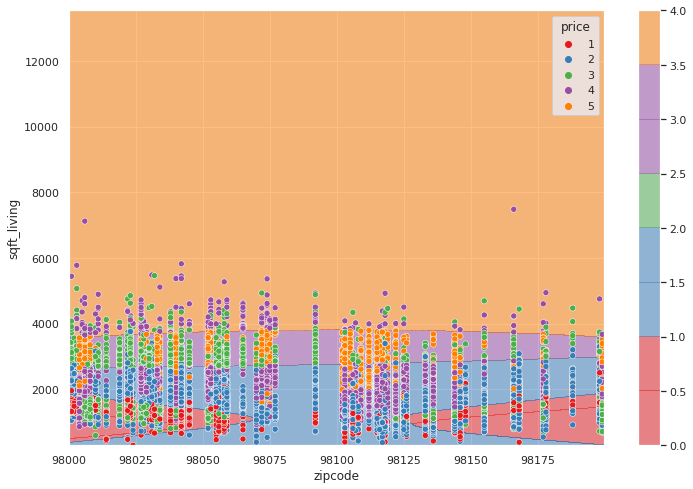

In [40]:
def bayes_plot(df,model="gnb",spread=30):
    df.dropna()
    colors = 'seismic'
    col1 = df.columns[0]
    col2 = df.columns[1]
    target = df.columns[2]
    sns.scatterplot(data=df, x=col1, y=col2,hue=target)
    plt.show()
    y = df[target]  # Target variable
    X = df.drop(target, axis=1)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=1)  # 70% training and 30% test

    clf = GaussianNB()
    if (model != "gnb"):
        clf = DecisionTreeClassifier(max_depth=model)
    clf = clf.fit(X_train, y_train)
    
    # Train Classifer
    

    prob = len(clf.classes_) == 2

    # Predict the response for test dataset

    y_pred = clf.predict(X_test)
    print(metrics.classification_report(y_test, y_pred))

    hueorder = clf.classes_
    def numify(val):
        return np.where(clf.classes_ == val)[0]

    Y = y.apply(numify)
    x_min, x_max = X.loc[:, col1].min() - 1, X.loc[:, col1].max() + 1
    y_min, y_max = X.loc[:, col2].min() - 1, X.loc[:, col2].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.2),
                         np.arange(y_min, y_max, 0.2))

    Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])
    if prob:

        Z = Z[:,1]-Z[:,0]
    else:
        colors = "Set1"
        Z = np.argmax(Z, axis=1)


    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, cmap=colors, alpha=0.5)
    plt.colorbar()
    if not prob:
        plt.clim(0,len(clf.classes_)+3)
    df['prediction'] = clf.predict(X)
    mislabled = df[df.prediction != df.price]
    sns.scatterplot(data=mislabled[::spread], x=col1, y=col2, hue=target, hue_order=hueorder,palette=colors)
    fig = plt.gcf()
    fig.set_size_inches(12, 8)
    plt.show()

bayes_plot(pd.concat([housing_data.zipcode, housing_data.sqft_living, housing_data.price], axis=1), spread=1)

The top graph show a scatter of zipcode/sqft_living value and dots are colored by price class
The Naive base classifier had an accuracy of 0.46, we can see in the graph the colored backround represents the predicted classes and the dots represnet the mislabled ones and their color is the correct price class

## Decision Tree
a. Baseline decision tree

Feature: bedrooms, Score: 0.02111
Feature: bathrooms, Score: 0.05548
Feature: sqft_living, Score: 0.26414
Feature: sqft_lot, Score: 0.08614
Feature: floors, Score: 0.00882
Feature: waterfront, Score: 0.00078
Feature: view, Score: 0.02331
Feature: condition, Score: 0.03717
Feature: grade, Score: 0.35733
Feature: sqft_above, Score: 0.09490
Feature: sqft_basement, Score: 0.04612
Feature: yr_built, Score: 0.24854
Feature: yr_renovated, Score: 0.00252
Feature: zipcode, Score: 0.28226
Feature: lat, Score: 0.19615
Feature: long, Score: 0.05883
Feature: sqft_living15, Score: 0.15208
Feature: sqft_lot15, Score: 0.15658
18 []


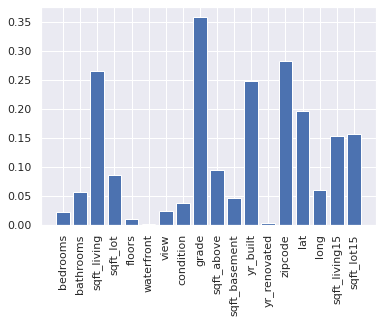

              precision    recall  f1-score   support

           1       0.51      0.56      0.53       452
           2       0.54      0.54      0.54      1017
           3       0.59      0.59      0.59      1473
           4       0.50      0.48      0.49       806
           5       0.58      0.57      0.58       401

    accuracy                           0.55      4149
   macro avg       0.54      0.55      0.55      4149
weighted avg       0.55      0.55      0.55      4149

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.176525 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.176525 to fit



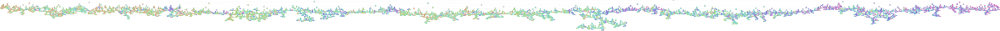

In [41]:
df = pd.read_csv('housing3.csv')
df.price = pd.Categorical(df.price)
df.dropna(inplace=True)
X = df.drop(["price","id","date"],axis=1)
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=1)  # 70% training and 30% test
clf = DecisionTreeClassifier()
clf.fit(X_train,y_train)

result = permutation_importance(clf, X, y, n_repeats=10,random_state=0)
importance = zip(X.columns,result['importances_mean'])
# summarize feature importance
for i,v in importance:
    print('Feature: %s, Score: %.5f' % (i,v))
# plot feature importance
print(len(X.columns),[x[1] for x in importance])
plt.bar(range(len(X.columns)), result['importances_mean'])
plt.xticks(ticks=range(len(X.columns)),labels=X.columns, rotation=90)
plt.show()

y_pred = clf.predict(X_test)

print(metrics.classification_report(y_test, y_pred))
dot_data = StringIO()
export_graphviz(clf,out_file=dot_data,filled=True,rounded=True,
                feature_names=X.columns,class_names=str(clf.classes_))

graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('house_prices.png') # attached within the submission zip
Image(graph.create_png())


The baseline classifier, running on data where na columns were dropped alongside date column (since the classifier can't handle it).
The accuracy is 0.55

b. decision tree based on our manipulated dataset selected features
We will keep only the values whose importance is larger than 0.15 and use our fixed dataset instead of the original one.


Feature: sqft_living, Score: 0.38366
Feature: grade, Score: 0.32410
Feature: yr_built, Score: 0.29342
Feature: zipcode, Score: 0.45485
Feature: sqft_lot15, Score: 0.25438
5 []


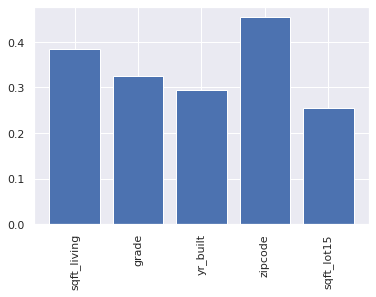

              precision    recall  f1-score   support

           1       0.55      0.56      0.55       600
           2       0.57      0.60      0.58      1328
           3       0.67      0.65      0.66      2104
           4       0.55      0.55      0.55      1108
           5       0.68      0.64      0.66       554

    accuracy                           0.61      5694
   macro avg       0.60      0.60      0.60      5694
weighted avg       0.61      0.61      0.61      5694

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.110182 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.110182 to fit



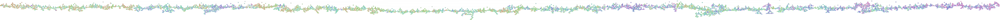

In [47]:
df = housing_data
df.dropna(inplace=True)
X = df.drop(["price","date", "bedrooms", "bathrooms", "sqft_lot", "floors", "view", "waterfront", "condition", "lat", "sqft_above","sqft_basement", "yr_renovated", "long", "sqft_living15", "living_ratio", "lot_ratio" ],axis=1)
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=1)  # 70% training and 30% test
clf = DecisionTreeClassifier()
clf.fit(X_train,y_train)plt.legend(labels=["price_1", "price_2", "price_3", "price_4", "price_5"])

result = permutation_importance(clf, X, y, n_repeats=10,random_state=0)
importance = zip(X.columns,result['importances_mean'])
# summarize feature importance
for i,v in importance:
    print('Feature: %s, Score: %.5f' % (i,v))
# plot feature importance
print(len(X.columns),[x[1] for x in importance])
plt.bar(range(len(X.columns)), result['importances_mean'])
plt.xticks(ticks=range(len(X.columns)),labels=X.columns, rotation=90)
plt.show()

y_pred = clf.predict(X_test)

print(metrics.classification_report(y_test, y_pred))
dot_data=StringIO()
export_graphviz(clf,out_file=dot_data,filled=True,rounded=True,feature_names=X.columns,class_names=str(clf.classes_))
graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('houses_manipulated.png')
Image(graph.create_png())


Using the fixed dataset and keeping only important features, we got a accuracy of 0.61 percent

# Summary
The results I got showed 0.46 accuracy for the naive bayes and 0.49 accuracy for the tree classifier. The baseline classifier was best with 0.53 accuracy.

I had problems with cleaning the data, many columns had NA values and I had to figure out the dependency between them to fill the values (sqft_living, sqft_above, sqft_basement). I also had to come up with a reasonable way to fill NA values on other columns, the best we came up was to use the average or most common value based on zipcode. our assumption was that nearby houses share the same features.

I had issues with zipcode values as well, my assumptions is that there is a clear corroloation between zipcodes and price values but i couldn't show it on the corrolation matrix since the values are categorical and are not ordered. but the pairplot proved my assumption as the couple (zipcode, sqft_living) managed to create the a clear seperation between classes and better classification both on the decision tree and the naive bayes classifiction.

I noted that for the most part classified the highest price point was most accurate on all models, this can be seen in the pairplot as well as this is always the most 'clear' cluster in each pair.


The worst issue I had is with RAM, I couldn't always run the model on a 16GB ram machine and sometimes it crashed due to insufficient ram

The best performance measure is precision, since the recall value better fits binary classification (yes/no) but we have a class with 5 different values. the f1 is an average of the two, but as we saif the recall is not fitting so it's best to use the precision feature.
